In [30]:
### from IPython.display import display
from IPython.display import HTML
import IPython.core.display as di # Example: di.display_html('<h3>%s:</h3>' % str, raw=True)

# This line will hide code by default when the notebook is exported as HTML
di.display_html('<script>jQuery(function() {if (jQuery("body.notebook_app").length == 0) { jQuery(".input_area").toggle(); jQuery(".prompt").toggle();}});</script>', raw=True)

# This line will add a button to toggle visibility of code blocks, for use with the HTML export version
di.display_html('''<button onclick="jQuery('.input_area').toggle(); jQuery('.prompt').toggle();">Toggle code</button>''', raw=True)


Toggle code

In [2]:
# all modules necessary for this nb
import os
import sys
import pickle

import numpy as np
import pylab as pl
import scipy.stats as sstats

# setting parameters for default matplotlib plots
%matplotlib inline

In [3]:
pl.style.use('fabiostyle')
# needs to find the library of functions
sys.path.append('../../../code/')  # to be replaced!

import utils as ut
import plots as pt

In [4]:
# %%javascript
# var nb = IPython.notebook;
# var kernel = IPython.notebook.kernel;
# var command = "NOTEBOOK_NAME = '" + nb.base_url + nb.notebook_path + "'";
# kernel.execute(command);

In [5]:
# NOTEBOOK_NAME = NOTEBOOK_NAME.split('/')[-1][:-6]
NOTEBOOK_NAME = 'decoder_weights_across_combined_0.5sec_dhpc'

In [6]:
from pickleshare import PickleShareDB

autorestore_folder = os.path.join(os.getcwd(), 'autorestore', NOTEBOOK_NAME)
db = PickleShareDB(autorestore_folder)
import sys
from workspace import *
import IPython
ip = IPython.get_ipython()

# this will restore all the saved variables. ignore the errors listed.
load_workspace(ip, db)

# use `save_worspace(db)` to save variables at the end

Unable to restore variable 'plot_ref_scores', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'load_all_animals_vars', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_distinct', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_distinct_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_cross_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_within_LOO', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_within_LOO_subset', ignoring (use %store -d to forget!)
('The error was:', <type 'exceptions.KeyError'>)
Unable to restore variable 'do_test_wi

In [7]:
from itertools import product
def load_all_animals_vars(varname, animal_list, pilot_list=None, notebook='preprocessing'):
    all_of_them = {}
    for ani in animal_list:
        folder = '../%s/notebooks/autorestore/%s/' % (ani, notebook)
        all_of_them.update({ani: ut.load_variable(varname, folder)})
    return all_of_them

In [8]:
#trying to use different trials for different time bins
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_distinct(patterns_t, labels_t, patterns_T, labels_T, n_cells=None, classes=None):
    if classes==None:
        classes=[0,1]
    which_train = {}
    which_test = {}
    for ani in patterns_t.keys():
        which_train_a = np.random.permutation(np.where(labels_t[ani]==0)[0])
        which_test_a = which_train_a[:len(which_train_a)/2]
        which_train_a = which_train_a[len(which_train_a)/2:]
        
        which_train_b = np.random.permutation(np.where(labels_t[ani]==1)[0])
        which_test_b = which_train_b[:len(which_train_b)/2]
        which_train_b = which_train_b[len(which_train_b)/2:]
        
        which_train[ani] = np.concatenate((which_train_a, which_train_b))
        which_test[ani] = np.concatenate((which_test_a, which_test_b))
    patterns_dt = patterns_t.copy()
    labels_dt = labels_t.copy()
    patterns_dT = patterns_T.copy()
    labels_dT = labels_T.copy()
    for ani in patterns_t.keys():
        patterns_dt[ani] = patterns_dt[ani][which_train[ani]]
        labels_dt[ani] = labels_dt[ani][which_train[ani]]
        patterns_dT[ani] = patterns_dT[ani][which_test[ani]]
        labels_dT[ani] = labels_dT[ani][which_test[ani]]      
        
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_dt, labels_dt)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_dT, labels_dT)
    
    if n_cells is None:
        cells = list(range(patterns_comb_train.shape[1]))
        print len(cells),
    elif n_cells > patterns_comb_train.shape[1]:
        cells = list(range(patterns_comb_train.shape[1]))
        #print len(cells),
    else:
        cells = np.random.choice(range(patterns_comb_train.shape[1]), size=n_cells, replace=False)
        #print cells.shape,
    
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [9]:
#trying to use different trials for different time bins
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_distinct_subset(patterns_t, labels_t, patterns_T, labels_T, cells, classes=[0,1]):
    which_train = {}
    which_test = {}
    for ani in patterns_t.keys():
        which_train_a = np.random.permutation(np.where(labels_t[ani]==0)[0])
        which_test_a = which_train_a[:len(which_train_a)/2]
        which_train_a = which_train_a[len(which_train_a)/2:]
        
        which_train_b = np.random.permutation(np.where(labels_t[ani]==1)[0])
        which_test_b = which_train_b[:len(which_train_b)/2]
        which_train_b = which_train_b[len(which_train_b)/2:]
        
        which_train[ani] = np.concatenate((which_train_a, which_train_b))
        which_test[ani] = np.concatenate((which_test_a, which_test_b))
    patterns_dt = patterns_t.copy()
    labels_dt = labels_t.copy()
    patterns_dT = patterns_T.copy()
    labels_dT = labels_T.copy()
    for ani in patterns_t.keys():
        patterns_dt[ani] = patterns_dt[ani][which_train[ani]]
        labels_dt[ani] = labels_dt[ani][which_train[ani]]
        patterns_dT[ani] = patterns_dT[ani][which_test[ani]]
        labels_dT[ani] = labels_dT[ani][which_test[ani]]      
        
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_dt, labels_dt)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_dT, labels_dT)
    
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [10]:
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross(patterns_t, labels_t, patterns_T, labels_T, n_cells=None, classes=None):
    if classes == None:
        classes = [0,1]
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)
    if n_cells is None:
        cells = list(range(patterns_comb_train.shape[1]))
        print len(cells),
    elif n_cells > patterns_comb_train.shape[1]:
        cells = list(range(patterns_comb_train.shape[1]))
        #print len(cells),
    else:
        cells = np.random.choice(range(patterns_comb_train.shape[1]), size=n_cells, replace=False)
        #print cells.shape,
    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [11]:
from sklearn.svm import SVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_cross_subset(patterns_t, labels_t, patterns_T, labels_T, cells, classes=None):
    if classes == None:
        classes = [0,1]
    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)

    decoder.fit(patterns_comb_train[:, cells], labels_comb)
    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
    decoder.fit(patterns_comb_test[:, cells], labels_comb)
    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [12]:
from sklearn.model_selection import cross_val_score, LeaveOneOut
from sklearn.svm import SVC, LinearSVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_within_LOO(patterns, labels, n_cells=None, n_loops=10, n_jobs=1, cv=LeaveOneOut()):    
    patterns_comb, labels_comb = ut.combine_patterns(patterns, labels)
    if n_cells is None:
        cells = list(range(patterns_comb.shape[1]))
    else:
        cells = np.random.choice(range(patterns_comb.shape[1]), size=n_cells, replace=False)
    scores = []
    scores = cross_val_score(decoder, patterns_comb[:, cells], labels_comb, cv=cv, n_jobs=n_jobs)
    #scores_chance = []
    #for i in xrange(n_loops):
    #    scores_chance.append(cross_val_score(decoder, ps, np.random.permutation(ls), cv=cv, n_jobs=n_jobs))
    #scores_chance = np.r_[scores_chance].flatten()
    return scores#, scores_chance

In [13]:
from sklearn.model_selection import cross_val_score, LeaveOneOut
from sklearn.svm import SVC, LinearSVC
decoder = SVC(kernel='linear', decision_function_shape='ovo')

def do_test_within_LOO_subset(patterns, labels, cells, n_loops=10, n_jobs=1, cv=LeaveOneOut()):    
    patterns_comb, labels_comb = ut.combine_patterns(patterns, labels)
    scores = []
    scores = cross_val_score(decoder, patterns_comb[:, cells], labels_comb, cv=cv, n_jobs=n_jobs)
    #scores_chance = []
    #for i in xrange(n_loops):
    #    scores_chance.append(cross_val_score(decoder, ps, np.random.permutation(ls), cv=cv, n_jobs=n_jobs))
    #scores_chance = np.r_[scores_chance].flatten()
    return scores#, scores_chance

In [15]:
#from sklearn.model_selection import KFold, LeaveOneOut
#from sklearn.svm import SVC
#
#def do_test_within_subset(patterns, labels, cells):
#   
#    which_train = {}
#    which_test = {}
#    for ani in patterns.keys():
#        which_train_a = np.random.permutation(np.where(labels[ani]==0)[0])
#        which_test_a = which_train_a[:len(which_train_a)/2]
#        which_train_a = which_train_a[len(which_train_a)/2:]
#        
#        which_train_b = np.random.permutation(np.where(labels[ani]==1)[0])
#        which_test_b = which_train_b[:len(which_train_b)/2]
#        which_train_b = which_train_b[len(which_train_b)/2:]
#        
#        which_train[ani] = np.concatenate((which_train_a, which_train_b))
#        which_test[ani] = np.concatenate((which_test_a, which_test_b))
#    
#    patterns_t = patterns.copy()
#    labels_t = labels.copy()
#    patterns_T = patterns.copy()
#    labels_T = labels.copy()
#    for ani in patterns.keys():
#        patterns_t[ani] = patterns[ani][which_train[ani]]
#        labels_t[ani] = labels[ani][which_train[ani]]
#        patterns_T[ani] = patterns[ani][which_test[ani]]
#        labels_T[ani] = labels[ani][which_test[ani]]
#    patterns_comb_train, labels_comb = ut.combine_patterns(patterns_t, labels_t)
#    patterns_comb_test, labels_comb = ut.combine_patterns(patterns_T, labels_T)
#    
#    decoder.fit(patterns_comb_train[:, cells], labels_comb)
#    scores = decoder.score(patterns_comb_test[:, cells], labels_comb)
#    decoder.fit(patterns_comb_test[:, cells], labels_comb)
#    return np.append(scores, decoder.score(patterns_comb_train[:, cells], labels_comb))

In [16]:
#get weights for decoding within a single session
from sklearn.svm import SVC
def do_test_within_weights(patterns, labels):
    
    patterns_comb_weights, labels_comb_weights = ut.combine_patterns(patterns, labels)
    decoder.fit(patterns_comb_weights,labels_comb_weights)
    weights = decoder.coef_[0]
    return weights
#additionally, could train classifier on both sessions for comparison, then take avg of their weights

In [17]:
decoder = SVC(kernel='linear', decision_function_shape='ovo')

In [18]:
all_animals =      'dhpcg1','dhpcg20','dhpc24'
pre_animals =      'dhpcg1','dhpcg20','dhpc24'
post_animals =     'dhpcg1','dhpcg20','dhpc24'
pre_rev_animals =  'dhpcg1','dhpcg20','dhpc24'
post_rev_animals = 'dhpcg1','dhpcg20','dhpc24'
catch_animals =    'dhpcg1','dhpcg20'

preVSpost_animals         = 'dhpcg1','dhpcg20','dhpc24'
preVSpre_rev_animals      = 'dhpcg1','dhpcg20','dhpc24'
preVSpost_rev_animals     =          'dhpcg20','dhpc24'
postVSpre_rev_animals     = 'dhpcg1','dhpcg20','dhpc24'
postVSpost_rev_animals    = 'dhpcg1','dhpcg20','dhpc24'
pre_revVSpost_rev_animals = 'dhpcg1','dhpcg20','dhpc24'
postVScatch_animals =       'dhpcg1'         ,'dhpcg20'
post_revVScatch_animals=    'dhpcg1'         ,'dhpcg20'

In [19]:
sessions = 'pre', 'post', 'pre_rev', 'post_rev', 'catch'

In [19]:
#delta_t0 = 0.5sec
#from referenced notebook, 28 time bins total beginning at 3s prior to odor onset and running through 10.5s post onset

#t_start0 = -3  # sec
#t_stop0 = 11  # sec
# CS BEGINS WITH TIME BIN 7 (tb6)
# TRACE BEGINS AT TB 11
# REWARD DELIVERED AT TB 15

In [20]:
for sess in sessions:
    for dur in 5,: #use 5 for 0.5sec, 1 for 1 sec and 2 for 2sec
        exec("patterns_tb_%s = dict(zip(%s_animals, [ut.load_variable('patterns_tb_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(sess,sess,sess,dur,sess))
        exec("labels_%s = dict(zip(%s_animals, [ut.load_variable('labels_%s',\
                                                         '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(sess,sess,sess,sess))

In [21]:
comparisons = 'preVSpost','preVSpre_rev','preVSpost_rev','postVSpre_rev','postVSpost_rev','pre_revVSpost_rev','postVScatch','post_revVScatch'

In [22]:
#get cross-session patterns
for comp in comparisons:
    for dur in 5,:
        exec("%s__patterns__%s = dict(zip(%s_animals, [ut.load_variable('%s_patterns_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(comp,comp.split('VS')[0],comp,
                                                    comp,comp.split('VS')[0],dur,comp))
        exec("%s__patterns__%s = dict(zip(%s_animals, [ut.load_variable('%s_patterns_%s_%s',\
                                                           '../%%s/notebooks/autorestore/patterns_time_bins/'%%ani)\
                                                  for ani in %s_animals]))"%(comp,comp.split('VS')[1],comp,
                                                    comp,comp.split('VS')[1],dur,comp))

In [23]:
relabel_rwVSsh = {0:-1,1:1,2:0}
relabel_rwVScsm = {0:0,1:1,2:-1}
relabel_shVScsm = {0:0,1:-1,2:1}
for sess in sessions:
    exec("labels_rwVSsh_%s = {}"%sess)
    exec("labels_rwVScsm_%s = {}"%sess)
    exec("labels_shVScsm_%s = {}"%sess)
    for ani in eval("%s_animals"%sess):
        exec("labels_rwVSsh_%s[ani] = np.r_[[relabel_rwVSsh[l] for l in labels_%s[ani]]]"%(sess,sess))
        exec("labels_rwVScsm_%s[ani] = np.r_[[relabel_rwVScsm[l] for l in labels_%s[ani]]]"%(sess,sess))
        exec("labels_shVScsm_%s[ani] = np.r_[[relabel_shVScsm[l] for l in labels_%s[ani]]]"%(sess,sess))

In [24]:
all_comparisons = 'preVSpost__patterns__pre',\
'preVSpost__patterns__post',\
'preVSpre_rev__patterns__pre',\
'preVSpre_rev__patterns__pre_rev',\
'preVSpost_rev__patterns__pre',\
'preVSpost_rev__patterns__post_rev',\
'postVSpre_rev__patterns__post',\
'postVSpre_rev__patterns__pre_rev',\
'postVSpost_rev__patterns__post',\
'postVSpost_rev__patterns__post_rev',\
'pre_revVSpost_rev__patterns__pre_rev',\
'pre_revVSpost_rev__patterns__post_rev',\
'postVScatch__patterns__post',\
'postVScatch__patterns__catch',\
'post_revVScatch__patterns__post_rev',\
'post_revVScatch__patterns__catch',\

In [25]:
for comp in all_comparisons:
    for t in range(len(patterns_tb_pre['dhpc24'])):
        exec("%s_tb_%s = {}"%(comp,t))
        for ani in eval('%s_animals'%comp.split('__')[0]):
            try:
                #print comp.split('-')[0],
                #print ani,
                #print t,
                exec("%s_tb_%s['%s'] = %s['%s'][%s]"%(comp,t,ani,comp,ani,t))
            except IOError as error:
                print 'ERROR'
            continue

# set whether you want to use all cells, downsample to min cells for each compared session, or dowsample to global minimum of cells across all comparisons

In [26]:
#set downsampling parameter to:
#max_cells = all cells
#intraregion_min = downsample to the comparison with fewest cells within the same hippo region
#interregion_min = downsample to the comparison with fewest cells, considering both hippo regions
#gmin = the global minimum (pretty much corresponds to interregion_min)

downsample = 200

In [27]:
if downsample == 'max_cells':
    n_cells = None #will use all registered cells
if downsample == 'intraregion_min':
    n_cells = ut.load_variable('n_cells_across_min_vhpc', '../notebooks/autorestore/n_cells/')
if downsample == 'interregion_min':
    n_cells = ut.load_variable('n_cells_across_min_overall', '../notebooks/autorestore/n_cells/')
if downsample == 'gmin':
    n_cells = ut.load_variable('n_cells_gmin', '../notebooks/autorestore/n_cells/')
if downsample == 200:
    n_cells = 200
print 'n_cells =',n_cells

n_cells = 200


In [28]:
for sess in sessions:
    for t in range(25):
        exec('patterns_tb_%s_%s = {}'%(t, sess))
        for ani in eval('%s_animals'%sess):
            try:
                print sess,
                print ani,
                exec("patterns_tb_%s_%s['%s'] = patterns_tb_%s['%s'][%s]"%(t,sess,ani,sess,ani,t))
            except IOError as error:
                print error
            continue

pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 pre dhpcg1 pre dhpcg20 pre dhpc24 post dhpcg1 post dhpcg20 post dhpc24 post dhpcg1 post dhpcg20 post dhpc24 post dhpcg1 post dhpcg20 post dhpc24 post dhpcg1 post dhpcg20 post dhpc24 po

In [29]:
%%time
#get decoder weights for each cell
n_loops=100

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('weights_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,
            eval("weights_%s_tb_%s"%(vs,t))[comp] = [do_test_within_weights(eval('%s_tb_%s'%(comp,t)),
                                                    eval('labels_%s_%s'%(vs,comp.split('__')[-1]))) for i in range(n_loops)]

preVSpost__patterns__pre 0 preVSpost__patterns__post 0 preVSpre_rev__patterns__pre 0 preVSpre_rev__patterns__pre_rev 0 preVSpost_rev__patterns__pre 0 preVSpost_rev__patterns__post_rev 0 postVSpre_rev__patterns__post 0 postVSpre_rev__patterns__pre_rev 0 postVSpost_rev__patterns__post 0 postVSpost_rev__patterns__post_rev 0 pre_revVSpost_rev__patterns__pre_rev 0 pre_revVSpost_rev__patterns__post_rev 0 postVScatch__patterns__post 0 postVScatch__patterns__catch 0 post_revVScatch__patterns__post_rev 0 post_revVScatch__patterns__catch 0 preVSpost__patterns__pre 1 preVSpost__patterns__post 1 preVSpre_rev__patterns__pre 1 preVSpre_rev__patterns__pre_rev 1 preVSpost_rev__patterns__pre 1 preVSpost_rev__patterns__post_rev 1 postVSpre_rev__patterns__post 1 postVSpre_rev__patterns__pre_rev 1 postVSpost_rev__patterns__post 1 postVSpost_rev__patterns__post_rev 1 pre_revVSpost_rev__patterns__pre_rev 1 pre_revVSpost_rev__patterns__post_rev 1 postVScatch__patterns__post 1 postVScatch__patterns__catch 1 p

In [30]:
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec("avg_weights_%s_tb_%s ={}"%(vs,t))
        exec("abs_avg_weights_%s_tb_%s={}"%(vs,t))
        for comp in all_comparisons:
            exec("avg_weights_%s_tb_%s[comp] = [np.mean(k) for k in zip(*weights_%s_tb_%s[comp])]"%(vs,t,vs,t))
            exec("abs_avg_weights_%s_tb_%s[comp] = map(abs,avg_weights_%s_tb_%s[comp])"%(vs,t,vs,t))

In [31]:
reference_tbs = range(25)

#fig, ax = pl.subplots(6,1, figsize=(2.5, 10))
#i=-1
#
#for sess in sessions:
#    i=i+1
#    x = abs_avg_weights_tb_12[sess]
#    y = abs_avg_weights_tb_17[sess]
#    ax[i].plot(x,y,'bo',markersize=.8,mew=.1,scalex=False,scaley=False)
#    #ax[i].set_xlim(-.08,.08)
#    #ax[i].set_ylim(-.08,.08)
#    for tb,lc,d in zip(('13','14','15','16','17','18','19'),('r','orange','g','cyan','b','purple','k'),
#                       ('1.5','2.0','2.5','3.0','3.5','4.0','4.5')):
#        y = eval("abs_avg_weights_tb_%s[sess]"%tb)
#        slope, intercept, r_value, p_value, std_err = sstats.linregress(x,y)
#        line = slope*(np.unique(x))+intercept
#        r2 = r_value*r_value
#        ax[i].plot(np.unique(x), line, '%s'%lc, label='1 vs {}s, r$^2$={:.2f}'.format(d,r2))
#    ax[i].set_title(sess)
#    ax[0].set_title('expo\ntb 1.0s vs tb x')
#ax[0].legend(loc='best',prop={'size': 3})
#pl.xlabel("decoder weights, tb 1.0",fontsize=5)
#pl.ylabel("decoder weights, tb x",fontsize=5)
##pl.xlim(-.08,.08)
##pl.ylim(-.08,.08)
#fig.tight_layout(pad=3)

fig, ax = pl.subplots(12,1, figsize=(2.5, 15))
i=-1

for tb in '6','7','8','9','10','11','12','13','14','15','16','17':
    i=i+1
    exec("x = abs_avg_weights_tb_%s[post_rev]"%tb)
    exec("y = abs_avg_weights_tb_%s[post_rev]"%tb)
    ax[i].plot(x,y,'bo',markersize=.8,mew=.1,scalex=False,scaley=False)
    #ax[i].set_xlim(-.08,.08)
    #ax[i].set_ylim(-.08,.08)
    for sess,lc,d in zip(('pre','post','pre_rev','post_rev','catch'),('cornflowerblue','b','lightcoral','r','k'),
                       ('pre','post','rev early','rev late','catch')):
        y = eval("abs_avg_weights_tb_%s[sess]"%tb)
        slope, intercept, r_value, p_value, std_err = sstats.linregress(x,y)
        line = slope*(np.unique(x))+intercept
        r2 = r_value*r_value
        ax[i].plot(np.unique(x), line, '%s'%lc, label='post_rev vs {}s, r$^2$={:.2f}'.format(d,r2))
    ax[i].set_title(sess)
    ax[0].set_title('rev late vs x, tb'+tb)
ax[0].legend(loc='best',prop={'size': 3})
pl.xlabel("decoder weights, rev late",fontsize=5)
pl.ylabel("decoder weights, sess",fontsize=5)
#pl.xlim(-.08,.08)
#pl.ylim(-.08,.08)
fig.tight_layout(pad=3)

##find Gini coef and lorenz curve for ref_tbs
#def Gini(v):
#    bins = np.linspace(0., 100., 11)
#    total = float(np.sum(v))
#    yvals = []
#    for b in bins:
#        bin_vals = v[v <= np.percentile(v, b)]
#        bin_fraction = (np.sum(bin_vals) / total) * 100.0
#        yvals.append(bin_fraction)
#    # perfect equality area
#    pe_area = np.trapz(bins, x=bins)
#    # lorenz area
#    lorenz_area = np.trapz(yvals, x=bins)
#    gini_val = (pe_area - lorenz_area) / float(pe_area)
#    return bins, yvals, gini_val
#
#v=np.array(abs_avg_weights_tb_20['expo'])
#
#bins, result, gini_val = Gini(v)
#pl.figure()
#pl.subplot(2, 1, 1)
#pl.plot(bins, result, label="observed")
#pl.plot(bins, bins, '--', label="perfect eq.")
#pl.xlabel("fraction of population")
#pl.ylabel("fraction of wealth")
#pl.title("GINI: %.4f" %(gini_val))
#pl.legend()
#pl.subplot(2, 1, 2)
#pl.hist(v, bins=20)

def gini(x):
    # (Warning: This is a concise implementation, but it is O(n**2)
    # in time and memory, where n = len(x).  *Don't* pass in huge
    # samples!)

    # Mean absolute difference
    mad = np.abs(np.subtract.outer(x, x)).mean()
    # Relative mean absolute difference
    rmad = mad/np.mean(x)
    # Gini coefficient
    g = 0.5 * rmad
    return g

for vs in 'rwVScsm','shVScsm','rwVSsh':
    exec("gini_coef_%s = {}"%vs)
    for sess in sessions:
        exec("gini_coef_%s[sess] = []"%vs)
        for tb in ref_tbs:
            exec("gini_coef_%s[sess].append(gini(abs_avg_weights_%s_tb_%s[sess]))"%(vs,vs,tb))

comparison = 'rwVSsh'
pl.plot(eval("gini_coef_%s"%comparison)['pre'],color='b')
pl.plot(eval("gini_coef_%s"%comparison)['post'],color='cornflowerblue')
pl.plot(eval("gini_coef_%s"%comparison)['pre_rev'],color='lightcoral')
pl.plot(eval("gini_coef_%s"%comparison)['post_rev'],color='r')
pl.plot(eval("gini_coef_%s"%comparison)['catch'],color='k')
pl.ylabel('Gini coef')
pl.xlabel('0.5s time bins')
pl.xticks(range(1,25,2),['bs','bs','bs','CS','CS','tr','tr','US','...'])
pl.legend(['pre','post','rev pre','rev post','catch'],loc='best', bbox_to_anchor=(1, 0.85))
pl.title('Gini index of decoder weights\n(dCA1, '+comparison+')')
pl.ylim(.5,.8)

pl.savefig("../img/%s_Gini_%s.jpg"%(NOTEBOOK_NAME,comparison))

comparison = 'rwVScsm'
pl.plot(eval("gini_coef_%s"%comparison)['pre'],color='b')
pl.plot(eval("gini_coef_%s"%comparison)['post'],color='cornflowerblue')
pl.plot(eval("gini_coef_%s"%comparison)['pre_rev'],color='lightcoral')
pl.plot(eval("gini_coef_%s"%comparison)['post_rev'],color='r')
pl.plot(eval("gini_coef_%s"%comparison)['catch'],color='k')
pl.ylabel('Gini coef')
pl.xlabel('0.5s time bins')
pl.xticks(range(1,25,2),['bs','bs','bs','CS','CS','tr','tr','US','...'])
pl.legend(['pre','post','rev pre','rev post','catch'],loc='best', bbox_to_anchor=(1, 0.85))
pl.title('Gini index of decoder weights\n(dCA1, '+comparison+')')
pl.ylim(.5,.8)

pl.savefig("../img/%s_Gini_%s.jpg"%(NOTEBOOK_NAME,comparison))

comparison = 'shVScsm'
pl.plot(eval("gini_coef_%s"%comparison)['pre'],color='b')
pl.plot(eval("gini_coef_%s"%comparison)['post'],color='cornflowerblue')
pl.plot(eval("gini_coef_%s"%comparison)['pre_rev'],color='lightcoral')
pl.plot(eval("gini_coef_%s"%comparison)['post_rev'],color='r')
pl.plot(eval("gini_coef_%s"%comparison)['catch'],color='k')
pl.ylabel('Gini coef')
pl.xlabel('0.5s time bins')
pl.xticks(range(1,25,2),['bs','bs','bs','CS','CS','tr','tr','US','...'])
pl.legend(['pre','post','rev pre','rev post','catch'],loc='best', bbox_to_anchor=(1, 0.85))
pl.title('Gini index of decoder weights\n(dCA1, '+comparison+')')
pl.ylim(.5,.8)

pl.savefig("../img/%s_Gini_%s.jpg"%(NOTEBOOK_NAME,comparison))

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        exec("weight_matrix_%s_%s = []"%(vs,sess))
        exec("abs_weight_matrix_%s_%s = []"%(vs,sess)) #for absolute values
        for tb in reference_tbs:
            exec("weight_matrix_%s_%s.append(avg_weights_%s_tb_%s[sess])"%(vs,sess,vs,tb))
            exec("abs_weight_matrix_%s_%s.append(abs_avg_weights_%s_tb_%s[sess])"%(vs,sess,vs,tb))
        exec("weight_matrix_%s_%s_trans = np.array(weight_matrix_%s_%s).T"%(vs,sess, vs,sess))
        exec("abs_weight_matrix_%s_%s_trans = np.array(abs_weight_matrix_%s_%s).T"%(vs,sess, vs,sess))

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for tb in reference_tbs:
        exec("max_norm_avg_weights_%s_tb_%s = {}"%(vs,tb))
        for sess in sessions:
            exec("max_norm_avg_weights_%s_tb_%s[sess]=[]"%(vs,tb))
            for i,x in zip(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb)),range(len(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb))))):
                eval("max_norm_avg_weights_%s_tb_%s[sess]"%(vs,tb)).insert(x,float(abs(i))/max(abs(np.array(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb))))))

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for tb in reference_tbs:
        exec("sum_norm_avg_weights_%s_tb_%s = {}"%(vs,tb))
        for sess in sessions:
            exec("sum_norm_avg_weights_%s_tb_%s[sess]=[]"%(vs,tb))
            for i,x in zip(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb)),range(len(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb))))):
                eval("sum_norm_avg_weights_%s_tb_%s[sess]"%(vs,tb)).insert(x,float(abs(i))/sum(abs(np.array(eval("avg_weights_%s_tb_%s[sess]"%(vs,tb))))))

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        exec("max_norm_weight_matrix_%s_%s = []"%(vs,sess))
        exec("sum_norm_weight_matrix_%s_%s = []"%(vs,sess))
        for tb in reference_tbs:
            exec("max_norm_weight_matrix_%s_%s.append(max_norm_avg_weights_%s_tb_%s[sess])"%(vs,sess,vs,tb))
            exec("sum_norm_weight_matrix_%s_%s.append(sum_norm_avg_weights_%s_tb_%s[sess])"%(vs,sess,vs,tb))
        
        indices = np.argsort(eval("max_norm_weight_matrix_%s_%s[0]"%(vs,sess))) #get order of indices when sorting data from first tb
        exec("sorted_max_norm_weight_matrix_%s_%s =[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]"%(vs,sess))
        for t in range(len(eval("max_norm_weight_matrix_%s_%s"%(vs,sess)))):
            for x in indices[::-1]:  #reverse to get descending order
                exec("sorted_max_norm_weight_matrix_%s_%s[t].append(max_norm_weight_matrix_%s_%s[t][x])"%(vs,sess,vs,sess))
        
        indices = np.argsort(eval("sum_norm_weight_matrix_%s_%s[0]"%(vs,sess))) #get order of indices when sorting data from first tb
        exec("sorted_sum_norm_weight_matrix_%s_%s =[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]"%(vs,sess))
        for t in range(len(eval("sum_norm_weight_matrix_%s_%s"%(vs,sess)))):
            for x in indices[::-1]:
                exec("sorted_sum_norm_weight_matrix_%s_%s[t].append(sum_norm_weight_matrix_%s_%s[t][x])"%(vs,sess,vs,sess))
                
        exec("max_norm_weight_matrix_%s_%s_trans = np.array(max_norm_weight_matrix_%s_%s).T"%(vs,sess, vs,sess))
        exec("sum_norm_weight_matrix_%s_%s_trans = np.array(sum_norm_weight_matrix_%s_%s).T"%(vs,sess, vs,sess))
        exec("sorted_max_norm_weight_matrix_%s_%s_trans = np.array(sorted_max_norm_weight_matrix_%s_%s).T"%(vs,sess,vs,sess))
        exec("sorted_sum_norm_weight_matrix_%s_%s_trans = np.array(sorted_sum_norm_weight_matrix_%s_%s).T"%(vs,sess,vs,sess))

#now gonna try and sort cells into time bins with max activity (then sort cells w/in specific tb in ascending order)
#first find tb for which each cell is maximially active
from operator import itemgetter

def max_val(l, i):
    return max(enumerate(map(itemgetter(i), l)),key=itemgetter(1))

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        exec("max_%s_tb_%s = []"%(vs,sess))
        for i in range(len(eval("abs_weight_matrix_%s_%s[0]"%(vs,sess)))):
            eval("max_%s_tb_%s"%(vs,sess)).insert(i,max_val(eval("abs_weight_matrix_%s_%s"%(vs,sess)),i))
        
#next, sort by tb, getting old index for cell ordering of other time bins
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        eval("max_%s_tb_%s"%(vs,sess)).sort(key=itemgetter(1),reverse=True) #first sort by weight value in decending order
        eval("max_%s_tb_%s"%(vs,sess)).sort(key=itemgetter(0)) #sort by tb to get list sorted by ascending tb and descending weight w/in a tb

#need to use method to sort if duplicate values.
#I suppose I could just use this method (vs cell below) for all sessions...so I will

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        exec("sort_index_%s_%s=[]"%(vs,sess))
        for x in eval("max_%s_tb_%s"%(vs,sess)):
            exec("sort_index_%s_%s.append(abs_weight_matrix_%s_%s[x[0]].index(x[1]))"%(vs,sess,vs,sess))
        exec("sort_index_%s_%s=[]"%(vs,sess))
        for x in eval("max_%s_tb_%s"%(vs,sess)):
            exec("sort_index_%s_%s.append(abs_weight_matrix_%s_%s[x[0]].index(x[1]))"%(vs,sess,vs,sess))

#for vs in 'rwVScsm','shVScsm','rwVSsh':
#    for sess in sessions:
#        exec("sort_index_%s_%s = []"%(vs,sess))
#        for x in eval("max_%s_tb_%s"%(vs,sess)):
#            for i, j in enumerate(eval("abs_weight_matrix_%s_%s"%(vs,sess))[x[0]]):
#                if j == x[1]:
#                    exec("sort_index_%s_%s.append(i)"%(vs,sess))

#check that sorted cell number matches the total number of cells
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        print vs,sess,": ",len(eval("abs_weight_matrix_%s_%s[5]"%(vs,sess))), len(eval("sort_index_%s_%s"%(vs,sess)))

#now sort each tb by sort_index
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for sess in sessions:
        exec("tb_sorted_weight_matrix_%s_%s =[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[],[]"%(vs,sess))
        for t in range(len(eval("abs_weight_matrix_%s_%s"%(vs,sess)))):
            for x in eval("sort_index_%s_%s"%(vs,sess)):
                exec("tb_sorted_weight_matrix_%s_%s[t].append(abs_weight_matrix_%s_%s[t][x])"%(vs,sess,vs,sess))
                exec("tb_sorted_weight_matrix_%s_%s_trans = np.array(tb_sorted_weight_matrix_%s_%s).T"%(vs,sess,vs,sess))

comparison='rwVSsh'
fig,axs = pl.subplots(1,5,figsize=(6,3))
for sess,c in zip(sessions,range(len(sessions))):
        im=axs[c].imshow(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess)),vmin=.0,vmax=.2, aspect='auto',cmap='hot')
        axs[c].set_title(sess,fontsize=7)
        axs[c].vlines(10.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        axs[c].vlines(14.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        pt.remove_axes(axs[c])
axs[0].text(1,675,' 0.5s time bins\n(dashes=trace)')
axs[0].set_ylabel('Cell #')
pl.suptitle('Decoding weights (dCA1 '+comparison+')',y=1,fontsize=8)
cax = fig.add_axes([.92, 0.2, 0.015, .6])
cbar=pl.colorbar(im,cax=cax)
cbar.set_label('raw decoder weight')
#
#fig.tight_layout()
fig.savefig("../img/%s_TBsort_raw_heatmap_%s.jpg"%(NOTEBOOK_NAME,comparison))


comparison='rwVScsm'
fig,axs = pl.subplots(1,5,figsize=(6,3))
for sess,c in zip(sessions,range(len(sessions))):
        im=axs[c].imshow(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess)),vmin=.0,vmax=.2, aspect='auto',cmap='hot')
        axs[c].set_title(sess,fontsize=7)
        axs[c].vlines(10.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        axs[c].vlines(14.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        pt.remove_axes(axs[c])
axs[0].text(1,675,' 0.5s time bins\n(dashes=trace)')
axs[0].set_ylabel('Cell #')
pl.suptitle('Decoding weights (dCA1 '+comparison+')',y=1,fontsize=8)
cax = fig.add_axes([.92, 0.2, 0.015, .6])
cbar=pl.colorbar(im,cax=cax)
cbar.set_label('raw decoder weight')
#
#fig.tight_layout()
fig.savefig("../img/%s_TBsort_raw_heatmap_%s.jpg"%(NOTEBOOK_NAME,comparison))


comparison='shVScsm'
fig,axs = pl.subplots(1,5,figsize=(6,3))
for sess,c in zip(sessions,range(len(sessions))):
        im=axs[c].imshow(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess)),vmin=.0,vmax=.2, aspect='auto',cmap='hot')
        axs[c].set_title(sess,fontsize=7)
        axs[c].vlines(10.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        axs[c].vlines(14.5,0,len(eval("tb_sorted_weight_matrix_%s_%s_trans"%(comparison,sess))),color='w',linestyle=':',linewidths=.8)
        pt.remove_axes(axs[c])
axs[0].text(1,675,' 0.5s time bins\n(dashes=trace)')
axs[0].set_ylabel('Cell #')
pl.suptitle('Decoding weights (dCA1 '+comparison+')',y=1,fontsize=8)
cax = fig.add_axes([.92, 0.2, 0.015, .6])
cbar=pl.colorbar(im,cax=cax)
cbar.set_label('raw decoder weight')
#
#fig.tight_layout()
fig.savefig("../img/%s_TBsort_raw_heatmap_%s.jpg"%(NOTEBOOK_NAME,comparison))


## first, decode within sessions (using all registered cells)

In [32]:
%%time
#decode at each time bin within a session. (sets reference for how well decoding can be for later comparison with cross sess)

n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_distinct_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            #print comp,t,c," ",
            exec('scores_distinct_within_%s_tb_%s[comp] = np.r_[[do_test_cross_distinct(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=None)\
            for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1],comp,t,vs,comp.split('__')[-1]))
        exec("print '%s: %s',"%(vs,comp))
        print 'DONE!', '  ',

360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: post_revVScatch__patterns__catch DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: post_revVScatch__patterns__catch DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: post_revVScatch__patterns__catch DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: post_revVScatch__patterns__catch DONE!    360 360 360 360 360 360 254 

In [33]:
#do same, but decode usng leave one out. This takes a while
n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t," ",
            exec('scores_within_%s_tb_%s[comp] = np.r_[[do_test_within_LOO(%s_tb_%s,labels_%s_%s,n_cells=None)\
            for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1]))
        exec("print '%s: %s',"%(vs,comp))
        print 'DONE!', '  ',

preVSpost__patterns__pre 0   preVSpost__patterns__post 0   preVSpre_rev__patterns__pre 0   preVSpre_rev__patterns__pre_rev 0   preVSpost_rev__patterns__pre 0   preVSpost_rev__patterns__post_rev 0   postVSpre_rev__patterns__post 0   postVSpre_rev__patterns__pre_rev 0   postVSpost_rev__patterns__post 0   postVSpost_rev__patterns__post_rev 0   pre_revVSpost_rev__patterns__pre_rev 0   pre_revVSpost_rev__patterns__post_rev 0   postVScatch__patterns__post 0   postVScatch__patterns__catch 0   post_revVScatch__patterns__post_rev 0   post_revVScatch__patterns__catch 0   rwVScsm: post_revVScatch__patterns__catch DONE!    preVSpost__patterns__pre 1   preVSpost__patterns__post 1   preVSpre_rev__patterns__pre 1   preVSpre_rev__patterns__pre_rev 1   preVSpost_rev__patterns__pre 1   preVSpost_rev__patterns__post_rev 1   postVSpre_rev__patterns__post 1   postVSpre_rev__patterns__pre_rev 1   postVSpost_rev__patterns__post 1   postVSpost_rev__patterns__post_rev 1   pre_revVSpost_rev__patterns__pre_rev 1

## take random cells and decode within session

In [34]:
%%time
n_loops = 3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('random_cells_scores_distinct_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,vs,
            exec('random_cells_scores_distinct_within_%s_tb_%s[comp] = np.r_[[do_test_cross_distinct(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=30)\
                    for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1],comp,t,vs,comp.split('__')[-1]))

preVSpost__patterns__pre 0 rwVScsm preVSpost__patterns__post 0 rwVScsm preVSpre_rev__patterns__pre 0 rwVScsm preVSpre_rev__patterns__pre_rev 0 rwVScsm preVSpost_rev__patterns__pre 0 rwVScsm preVSpost_rev__patterns__post_rev 0 rwVScsm postVSpre_rev__patterns__post 0 rwVScsm postVSpre_rev__patterns__pre_rev 0 rwVScsm postVSpost_rev__patterns__post 0 rwVScsm postVSpost_rev__patterns__post_rev 0 rwVScsm pre_revVSpost_rev__patterns__pre_rev 0 rwVScsm pre_revVSpost_rev__patterns__post_rev 0 rwVScsm postVScatch__patterns__post 0 rwVScsm postVScatch__patterns__catch 0 rwVScsm post_revVScatch__patterns__post_rev 0 rwVScsm post_revVScatch__patterns__catch 0 rwVScsm preVSpost__patterns__pre 1 rwVScsm preVSpost__patterns__post 1 rwVScsm preVSpre_rev__patterns__pre 1 rwVScsm preVSpre_rev__patterns__pre_rev 1 rwVScsm preVSpost_rev__patterns__pre 1 rwVScsm preVSpost_rev__patterns__post_rev 1 rwVScsm postVSpre_rev__patterns__post 1 rwVScsm postVSpre_rev__patterns__pre_rev 1 rwVScsm postVSpost_rev__pat

In [35]:
%%time
n_loops = 3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        exec('random_cells_scores_within_%s_tb_%s = {}'%(vs,t))
        for comp in all_comparisons:
            print comp,t,vs,
            exec('random_cells_scores_within_%s_tb_%s[comp] = np.r_[[do_test_within_LOO(%s_tb_%s,labels_%s_%s,n_cells=30)\
                    for r in range(n_loops)]]'%(vs,t,comp,t,vs,comp.split('__')[-1]))

preVSpost__patterns__pre 0 rwVScsm preVSpost__patterns__post 0 rwVScsm preVSpre_rev__patterns__pre 0 rwVScsm preVSpre_rev__patterns__pre_rev 0 rwVScsm preVSpost_rev__patterns__pre 0 rwVScsm preVSpost_rev__patterns__post_rev 0 rwVScsm postVSpre_rev__patterns__post 0 rwVScsm postVSpre_rev__patterns__pre_rev 0 rwVScsm postVSpost_rev__patterns__post 0 rwVScsm postVSpost_rev__patterns__post_rev 0 rwVScsm pre_revVSpost_rev__patterns__pre_rev 0 rwVScsm pre_revVSpost_rev__patterns__post_rev 0 rwVScsm postVScatch__patterns__post 0 rwVScsm postVScatch__patterns__catch 0 rwVScsm post_revVScatch__patterns__post_rev 0 rwVScsm post_revVScatch__patterns__catch 0 rwVScsm preVSpost__patterns__pre 1 rwVScsm preVSpost__patterns__post 1 rwVScsm preVSpre_rev__patterns__pre 1 rwVScsm preVSpre_rev__patterns__pre_rev 1 rwVScsm preVSpost_rev__patterns__pre 1 rwVScsm preVSpost_rev__patterns__post_rev 1 rwVScsm postVSpre_rev__patterns__post 1 rwVScsm postVSpre_rev__patterns__pre_rev 1 rwVScsm postVSpost_rev__pat

## now decode across sessions (using all registered cells)

In [26]:
%%time
#test across session pairs
AC = all_comparisons
n_cells = None #how many random cells to use?
n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('scores_%s_tb_%s = {}'%(vs,t))
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("scores_%s_tb_%s[AC[i].split('__')[0]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t, AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 0 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 1 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 2 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 3 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 4 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 5 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 6 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 125 125 125 218 218 218 rwVScsm: 7 DONE!    360 360 360 254 254 254 200 200 200 617 617 617 281 281 281 375 375 375 

In [27]:
%%time
#test across session pairs (alternate way where run separately for each sess in pair. A sanity check on the above)
AC = all_comparisons
n_cells = None #how many random cells to use?
n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        #exec('scores_%s_tb_%s = {}'%(vs,t))  DO NOT REDEFINE THIS VARIABLE, AS WILL LOSE DATA STORED IN IT FROM ABOVE!
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("scores_%s_tb_%s[AC[i]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                exec("scores_%s_tb_%s[AC[i+1]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: 0 DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: 1 DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: 2 DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 125 125 125 125 218 218 218 218 218 218 rwVScsm: 3 DONE!    360 360 360 360 360 360 254 254 254 254 254 254 200 200 200 200 200 200 617 617 617 617 617 617 281 281 281 281 281 281 375 375 375 375 375 375 125 125 

## next decode across sessions using random cells

In [40]:
%%time
#test across session pairs
AC = all_comparisons
n_cells = 30 #how many random cells to use?
n_loops=3
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25):
        exec('random_cells_scores_%s_tb_%s = {}'%(vs,t))
        for i in range(0,len(AC),2):
                #print comp,t,c," ",
                exec("random_cells_scores_%s_tb_%s[AC[i].split('__')[0]] = np.r_[[do_test_cross(%s_tb_%s,labels_%s_%s,%s_tb_%s,labels_%s_%s,n_cells=n_cells,classes=None)\
                for r in range(n_loops)]]"%(vs,t,
                                            AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
        exec("print '%s: %s',"%(vs,t))
        print 'DONE!','  ',

rwVScsm: 0 DONE!    rwVScsm: 1 DONE!    rwVScsm: 2 DONE!    rwVScsm: 3 DONE!    rwVScsm: 4 DONE!    rwVScsm: 5 DONE!    rwVScsm: 6 DONE!    rwVScsm: 7 DONE!    rwVScsm: 8 DONE!    rwVScsm: 9 DONE!    rwVScsm: 10 DONE!    rwVScsm: 11 DONE!    rwVScsm: 12 DONE!    rwVScsm: 13 DONE!    rwVScsm: 14 DONE!    rwVScsm: 15 DONE!    rwVScsm: 16 DONE!    rwVScsm: 17 DONE!    rwVScsm: 18 DONE!    rwVScsm: 19 DONE!    rwVScsm: 20 DONE!    rwVScsm: 21 DONE!    rwVScsm: 22 DONE!    rwVScsm: 23 DONE!    rwVScsm: 24 DONE!    shVScsm: 0 DONE!    shVScsm: 1 DONE!    shVScsm: 2 DONE!    shVScsm: 3 DONE!    shVScsm: 4 DONE!    shVScsm: 5 DONE!    shVScsm: 6 DONE!    shVScsm: 7 DONE!    shVScsm: 8 DONE!    shVScsm: 9 DONE!    shVScsm: 10 DONE!    shVScsm: 11 DONE!    shVScsm: 12 DONE!    shVScsm: 13 DONE!    shVScsm: 14 DONE!    shVScsm: 15 DONE!    shVScsm: 16 DONE!    shVScsm: 17 DONE!    shVScsm: 18 DONE!    shVScsm: 19 DONE!    shVScsm: 20 DONE!    shVScsm: 21 DONE!    shVScsm: 22 DONE!    shVScsm: 23 

In [ ]:
#def plot_scores(scores,col,last_plot,bins=25):
#    colors=['cornflowerblue','b','lightcoral','r','k']
#    for t in range(bins):
#        scoresP = eval("%s_%s"%(scores,t))
#        for sess,r in zip(sessions,range(len(sessions))):
#            ax[col][r].plot((t/2.0)-2.75, np.mean(scoresP[sess])*100, 'o', color=colors[r], ls='-',lw=.5, zorder=19 ,ms=1)
#            m = np.mean(scoresP[sess])*100
#            s = np.std(scoresP[sess])*100 / np.sqrt(scoresP[sess].shape[-1])
#            ax[col][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
#    
#    for x in range (0,5):
#        ax[0][0].set_ylim(0, 100)
#        ax[0][0].set_xlim(-3.5, 9)
#        ax[0][0].set_xticks(np.arange(-3,9, 1))
#        ax[0][0].set_xticklabels(np.arange(-3,9, 1))
#        for y in range(2):
#            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
#            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
#            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
#            ax[y][x].hlines(50, -6,11, color='k', lw=1, linestyles='dotted')
#            #ax[y][x].vlines(reference_tb/2.0-4.25,0,100,color='r',lw=0.5,linestyles='--')
#        ax[0][0].set_ylabel('Performance %\n(all cells)')
#        ax[0][0].set_title('early',fontsize=8)
#        ax[0][1].set_title('late',fontsize=8)
#        ax[0][2].set_title('rev early',fontsize=8)
#        ax[0][3].set_title('rev late',fontsize=8)
#        ax[0][4].set_title('catch',fontsize=8)
#        fig.tight_layout(pad=3)
#    
#    if last_plot == True:
#        ax[col][x].set_xlabel('Time from odor onset (s)',fontsize=6)
#        ax[col][0].set_ylabel('ax[x][0].set_ylabel("title")')

In [ ]:
#fig, ax = pl.subplots(2,5, figsize=(9, 2.5),sharex=True, sharey=True)
#
#plot_scores('scores_rwVScsm_tb',0,False)
#plot_scores('random_cells_scores_rwVScsm_tb',1,True)
#
#ax[1][0].set_ylabel('Performance %\n(30 random cells)')
#pl.suptitle('Rew vs Sh',fontsize=9)
#
##fig.savefig('../img/%s_horizontal_tb_%s.jpg'%(NOTEBOOK_NAME,reference_tb))

## now get subsets of cells, then decode using those subsets (across, and perhaps within too)

In [41]:
#find index of cells that are above some threshold
weight_thresh = 0.01
percentile_thresh = 90
top_cells=30
bottom25_percentile_thresh = 25
bottom15_percentile_thresh = 15
top_20 = 20

for vs in 'rwVScsm','shVScsm','rwVSsh':
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_top_abs = []"%(vs,comp,tb))
            exec("cells_thresh_%s_%s_%s = sorted(range(len(abs_avg_weights_%s_tb_%s[comp])),\
                                    key=lambda i: abs_avg_weights_%s_tb_%s[comp][i],reverse=True)[:top_cells]"%(vs,comp,tb,vs,tb,vs,tb))
            exec("cells_%s_%s_%s_top_abs = cells_thresh_%s_%s_%s[:]"%(vs,comp,tb,vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_percentile_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) > np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),percentile_thresh):
                    exec("cells_%s_%s_%s_percentile_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_weight_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) > weight_thresh:
                    exec("cells_%s_%s_%s_weight_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_bottom25_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) <= np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),bottom25_percentile_thresh):
                    exec("cells_%s_%s_%s_bottom25_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_bottom15_abs = []"%(vs,comp,tb))
            for idx in range(0, eval("len(abs_avg_weights_%s_tb_%s[comp])"%(vs,tb))): 
                if eval("abs_avg_weights_%s_tb_%s[comp][idx]"%(vs,tb)) <= np.percentile(eval("abs_avg_weights_%s_tb_%s[comp]"%(vs,tb)),bottom15_percentile_thresh):
                    exec("cells_%s_%s_%s_bottom15_abs.append(idx)"%(vs,comp,tb))
    for comp in all_comparisons:
        for tb in reference_tbs:
            exec("cells_%s_%s_%s_top_20_abs = []"%(vs,comp,tb))
            exec("cells_thresh_%s_%s_%s = sorted(range(len(abs_avg_weights_%s_tb_%s[comp])),\
                                    key=lambda i: abs_avg_weights_%s_tb_%s[comp][i],reverse=True)[:top_20]"%(vs,comp,tb,vs,tb,vs,tb))
            exec("cells_%s_%s_%s_top_20_abs = cells_thresh_%s_%s_%s[:]"%(vs,comp,tb,vs,comp,tb))

In [10]:
%%time
AC=all_comparisons
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        for threshold_method in 'top_abs',:#'percentile_abs','weight_abs':
            for tb in reference_tbs:
                exec('subset_scores_%s_tb_%s_%s_%s = {}'%(vs,t,tb,threshold_method))
                n_loops = 10
                for i in range(0,len(AC),2):
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i],tb,threshold_method)) #first use cell subset from sess1
                    #print sess,t,
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i+1],tb,threshold_method)) #then use cell subset from sess2
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i+1]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
        exec("print '%s: %s %s',"%(vs,threshold_method,t))
        print 'DONE!','  ',

rwVScsm: top_abs 0 DONE!    rwVScsm: top_abs 1 DONE!    rwVScsm: top_abs 2 DONE!    rwVScsm: top_abs 3 DONE!    rwVScsm: top_abs 4 DONE!    rwVScsm: top_abs 5 DONE!    rwVScsm: top_abs 6 DONE!    rwVScsm: top_abs 7 DONE!    rwVScsm: top_abs 8 DONE!    rwVScsm: top_abs 9 DONE!    rwVScsm: top_abs 10 DONE!    rwVScsm: top_abs 11 DONE!    rwVScsm: top_abs 12 DONE!    rwVScsm: top_abs 13 DONE!    rwVScsm: top_abs 14 DONE!    rwVScsm: top_abs 15 DONE!    rwVScsm: top_abs 16 DONE!    rwVScsm: top_abs 17 DONE!    rwVScsm: top_abs 18 DONE!    rwVScsm: top_abs 19 DONE!    rwVScsm: top_abs 20 DONE!    rwVScsm: top_abs 21 DONE!    rwVScsm: top_abs 22 DONE!    rwVScsm: top_abs 23 DONE!    rwVScsm: top_abs 24 DONE!    shVScsm: top_abs 0 DONE!    shVScsm: top_abs 1 DONE!    shVScsm: top_abs 2 DONE!    shVScsm: top_abs 3 DONE!    shVScsm: top_abs 4 DONE!    shVScsm: top_abs 5 DONE!    shVScsm: top_abs 6 DONE!    shVScsm: top_abs 7 DONE!    shVScsm: top_abs 8 DONE!    shVScsm: top_abs 9 DONE!    shVSc

In [ ]:
%%time
AC=all_comparisons
for vs in 'rwVScsm','shVScsm','rwVSsh':
    for t in range(25): # number of time bins
        for threshold_method in 'top_20_abs',:#bottom15_abs':
            for tb in reference_tbs:
                exec('subset_scores_%s_tb_%s_%s_%s = {}'%(vs,t,tb,threshold_method))
                n_loops = 10
                for i in range(0,len(AC),2):
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i],tb,threshold_method)) #first use cell subset from sess1
                    #print sess,t,
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i],t,vs,AC[i].split('__')[-1],AC[i+1],t,vs,AC[i+1].split('__')[-1]))
                    exec("cells = cells_%s_%s_%s_%s"%(vs,AC[i+1],tb,threshold_method)) #then use cell subset from sess2
                    exec("subset_scores_%s_tb_%s_%s_%s[AC[i+1]] = np.r_[[do_test_cross_subset(%s_tb_%s,labels_%s_%s,\
                          %s_tb_%s,labels_%s_%s,cells) for r in range(n_loops)]]"%(vs,t,tb,threshold_method,
                          AC[i+1],t,vs,AC[i+1].split('__')[-1],AC[i],t,vs,AC[i].split('__')[-1]))
        exec("print '%s: %s %s',"%(vs,threshold_method,t))
        print 'DONE!','  ',

In [36]:
subset_scores_rwVScsm_tb_0_0_top_abs['preVSpost__patterns__post']

array([[ 0.435,  0.51 ],
       [ 0.565,  0.56 ],
       [ 0.545,  0.47 ],
       [ 0.56 ,  0.485],
       [ 0.505,  0.49 ],
       [ 0.525,  0.53 ],
       [ 0.56 ,  0.58 ],
       [ 0.525,  0.51 ],
       [ 0.53 ,  0.605],
       [ 0.585,  0.535]])

In [36]:
for x in range(len(all_comparisons)):
    print x,':',all_comparisons[x]

 0 : preVSpost__patterns__pre
1 : preVSpost__patterns__post
2 : preVSpre_rev__patterns__pre
3 : preVSpre_rev__patterns__pre_rev
4 : preVSpost_rev__patterns__pre
5 : preVSpost_rev__patterns__post_rev
6 : postVSpre_rev__patterns__post
7 : postVSpre_rev__patterns__pre_rev
8 : postVSpost_rev__patterns__post
9 : postVSpost_rev__patterns__post_rev
10 : pre_revVSpost_rev__patterns__pre_rev
11 : pre_revVSpost_rev__patterns__post_rev
12 : postVScatch__patterns__post
13 : postVScatch__patterns__catch
14 : post_revVScatch__patterns__post_rev
15 : post_revVScatch__patterns__catch


In [22]:
def plot_ref_scores(vs,method,scores = 'subset_scores',ylabel='input ylabel variable',
                    all_cells_overlay=False,subset_cells_overlay=False,plot=range(len(all_comparisons)),size=(10,20)):
    
    to_plot=[]
    for x in plot:
        to_plot.append(all_comparisons[x])
    print 'plotting:'
    for x in to_plot:
        print x.split('__')[0]+x.split('__')[-1],"   ",
    
    colors=['pink','pink','lightcoral','lightcoral','r','r','lightblue','lightblue','b','b','g','g',
            'fuchsia','fuchsia','blueviolet','blueviolet']
    fig, ax = pl.subplots((len(reference_tbs)+2),len(to_plot), figsize=size,sharex=True, sharey=True)
    
    #plot scores using all cells
    for t in range(25):
        for comp,r,x in zip(to_plot,range(len(to_plot)),plot):
            ax[0][r].plot((t/2.0)-2.75, np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100, 'o', color=colors[x], ls='-',lw=.5, zorder=19 ,ms=1)
            m = np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100
            s = np.std(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100 / np.sqrt(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)).shape[-1])
            ax[0][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
            
    #plot top scores at each reference tb for scores using subset of cells
    for tb in (reference_tbs):
        for comp,r in zip(to_plot,range(len(to_plot))):
            scoresP = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,tb,tb,method))
            ax[1][r].plot((tb/2.0)-2.75, np.mean(scoresP[comp])*100, 'o', color='grey', ls='-',lw=.5, zorder=19 ,ms=1)
            m = np.mean(scoresP[comp])*100
            s = np.std(scoresP[comp])*100 / np.sqrt(scoresP[comp].shape[-1])
            ax[1][r].errorbar((tb/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
            if all_cells_overlay==True:
                ax[1][r].plot((tb/2.0)-2.75,np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,tb)))*100, 'o', color='k', ls='-',lw=.5, zorder=19 ,ms=1)
        
    #plot scores obtained from the subset of cells
    for tb,a in zip(reference_tbs,range(2,len(reference_tbs)+2)):
        for t in range(25):
            scoresP = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,t,tb,method))
            for comp,r,x in zip(to_plot,range(len(to_plot)),plot):
                ax[a][r].plot((t/2.0)-2.75, np.mean(scoresP[comp])*100, 'o', color=colors[x], ls='-',lw=.5, zorder=19 ,ms=1)
                m = np.mean(scoresP[comp])*100
                s = np.std(scoresP[comp])*100 / np.sqrt(scoresP[comp].shape[-1])
                ax[a][r].errorbar((t/2.0)-2.75, m, s, lw=0, zorder=0, color= 'k', elinewidth=1)
                if all_cells_overlay==True:
                    ax[a][r].plot((t/2.0)-2.75,np.mean(eval("scores_%s_tb_%s[comp.split('__')[0]]"%(vs,t)))*100, 'o', color='k', ls='-',lw=.5, zorder=19 ,ms=1)
                if subset_cells_overlay==True:
                    scoresO = eval("%s_%s_tb_%s_%s_%s"%(scores,vs,t,t,method))
                    ax[a][r].plot((t/2.0)-2.75,np.mean(scoresO[comp])*100, 'o', color='grey', ls='-',lw=.5, zorder=19 ,ms=1)    
                
    for x,z in zip(range(len(plot)),plot):
        ax[0][0].set_ylim(0, 100)
        ax[0][0].set_xlim(-3, 10)
        ax[0][0].set_xticks(np.arange(-3,10, 1))
        ax[0][0].set_xticklabels(np.arange(-3,10, 1))
        ax[0][x].set_xlabel('Time from odor\nonset (s)',fontsize=4.5)
        ax[0][x].set_title(all_comparisons[z].split('__')[0]+"\n"+all_comparisons[z].split('__')[-1],fontsize=3)
        ax[len(reference_tbs)+1][x].set_xlabel('Time from odor\nonset (s)',fontsize=4.5)
    
        for y,tb in zip(range(0,len(reference_tbs)),reference_tbs):
            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
            ax[y][x].hlines(50, -3,9, color='k', lw=1, linestyles='dotted')
            ax[y][0].set_ylabel(ylabel,fontsize=4)
        for y,tb in zip(range(2,len(reference_tbs)+2),reference_tbs): #the above doesn't cover the last row
            ax[y][x].vlines(tb/2.0-2.75,0,100,color='r',lw=0.5,linestyles='--')
            pt.plot_period_bar(ax[y][x], 25, start_end=(0, 2), color='r', delta_y=3)
            pt.plot_period_bar(ax[y][x], 25, start_end=(4, 4.2), color='b', delta_y=3)
            ax[y][x].hlines(25+1, 2, 4, color='k', lw=0.5, linestyles='dotted')
            ax[y][x].hlines(50, -3,9, color='k', lw=1, linestyles='dotted')
            ax[y][0].set_ylabel(ylabel,fontsize=4)
    
    ax[0][0].set_title(all_comparisons[plot[0]].split('__')[0]+" "+all_comparisons[plot[0]].split('__')[-1]+'\n'+vs, fontsize=2.5)
    ax[0][0].set_ylabel('Performance %\n(all cells)',fontsize=4)
    ax[1][0].set_ylabel('BEST '+ylabel,fontsize=4)
                              
    #pl.suptitle(vs)
    #fig.tight_layout(pad=3)
    
    fig.savefig('../img/%s_horizontal_all_tbs_%s_%s.jpg'%(NOTEBOOK_NAME,vs,method))

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    CPU times: user 39min 47s, sys: 1min 13s, total: 41min 1s
Wall time: 39min 44s



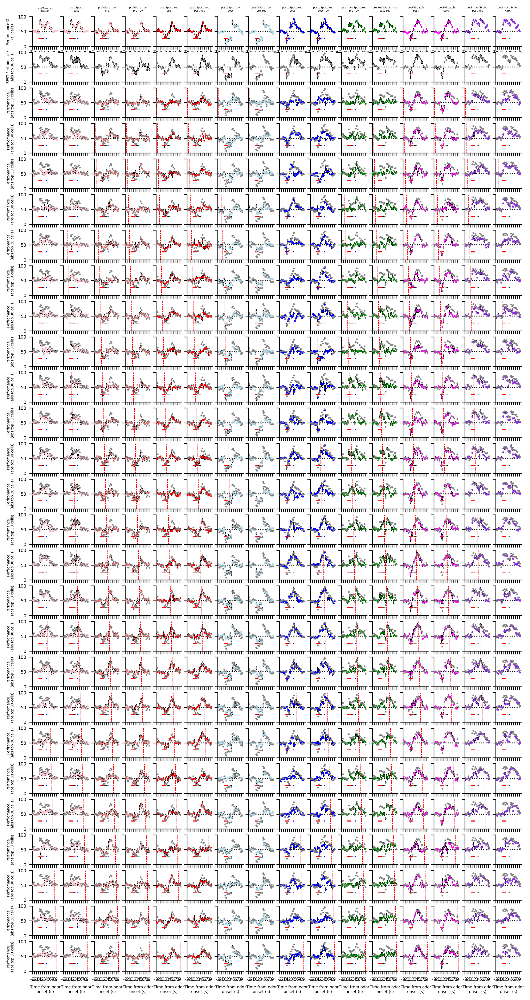

In [37]:
%%time
plot_ref_scores('rwVSsh','top_abs',ylabel='Perfromance\n(abs top 30 cells)',subset_cells_overlay=True)

plotting:
postVSpre_revpre_rev     postVSpost_revpost_rev     postVScatchcatch    CPU times: user 1min 46s, sys: 1.49 s, total: 1min 48s
Wall time: 1min 47s



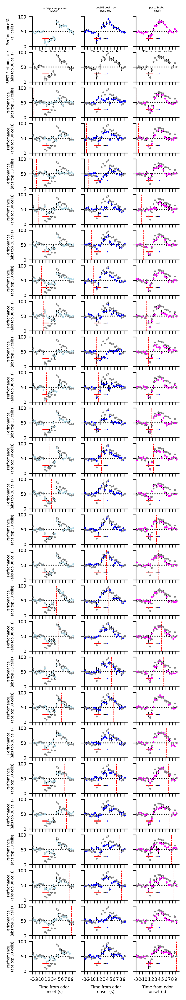

In [38]:
%%time
plot_ref_scores('rwVSsh','top_abs',ylabel='Perfromance\n(abs top 30 cells)',subset_cells_overlay=True,plot=(7,9,13),size=(3,20))

In [ ]:
plot_ref_scores('rwVSsh','percentile_abs',ylabel='Perfromance\n(abs 90th %ile)',subset_cells_overlay=True,)

In [ ]:
#plot_ref_scores('rwVSsh','weight_abs',ylabel='Perfromance\n(abs w > 0.01)',subset_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


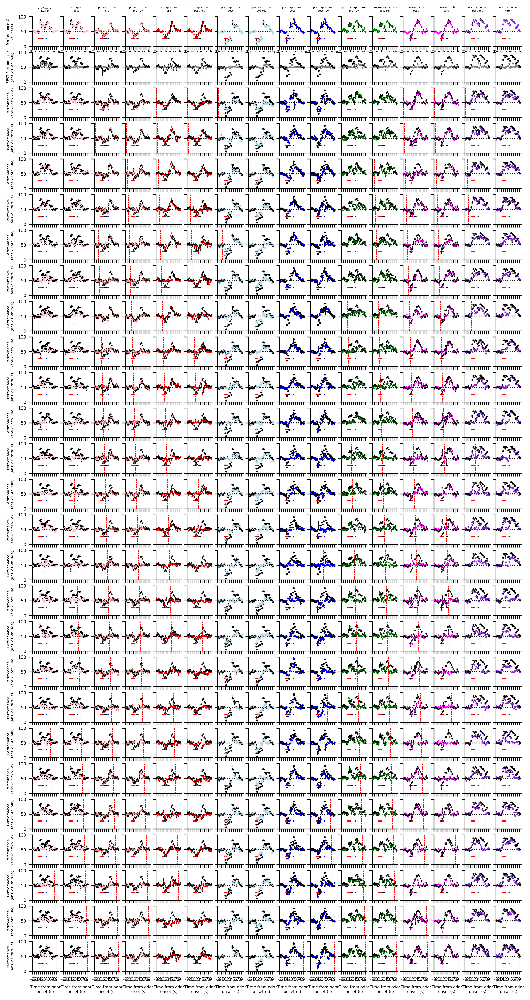

In [39]:
plot_ref_scores('rwVSsh','bottom15_abs',ylabel='Perfromance\n(abs <15th %ile)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


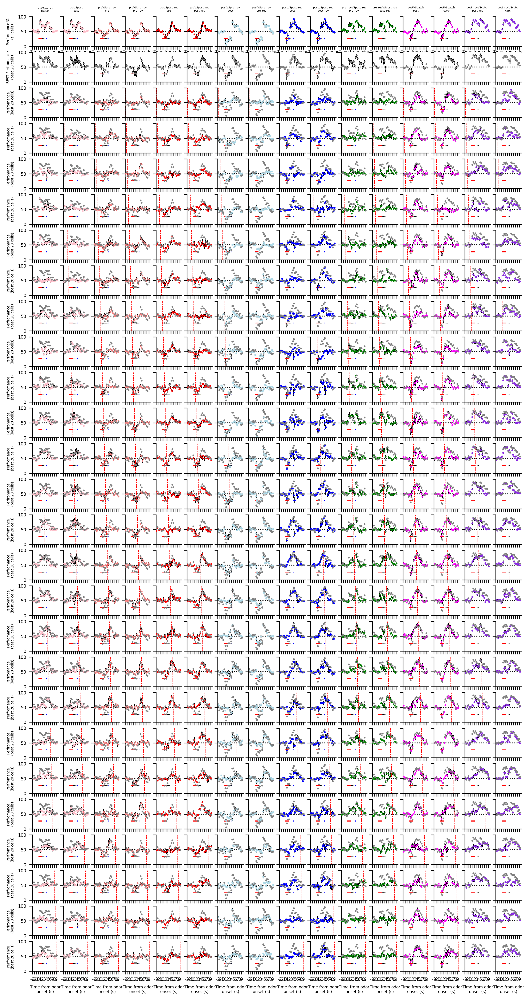

In [40]:
plot_ref_scores('rwVSsh','top_20_abs',ylabel='Perfromance\n(best 20 cells)',subset_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


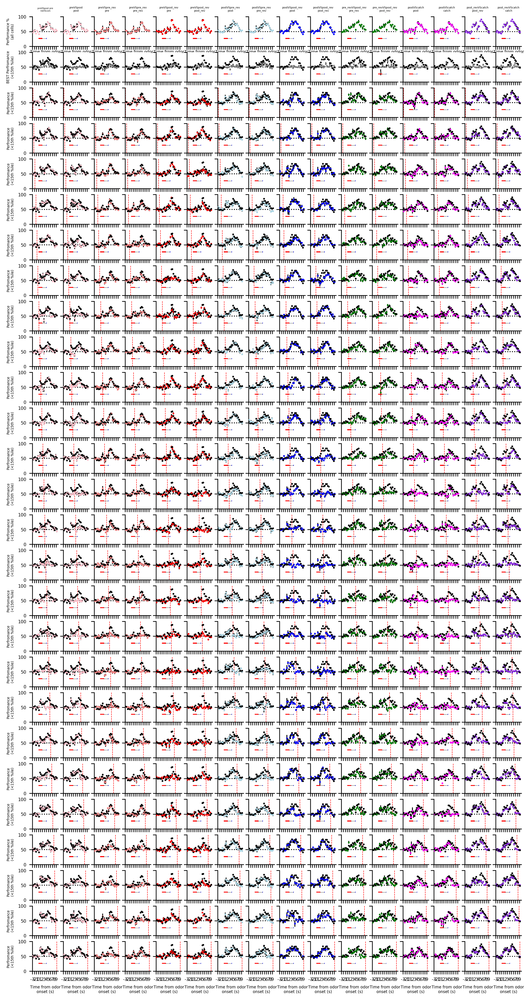

In [41]:
plot_ref_scores('rwVScsm','bottom15_abs',ylabel='Perfromance\n(<15th %ile)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


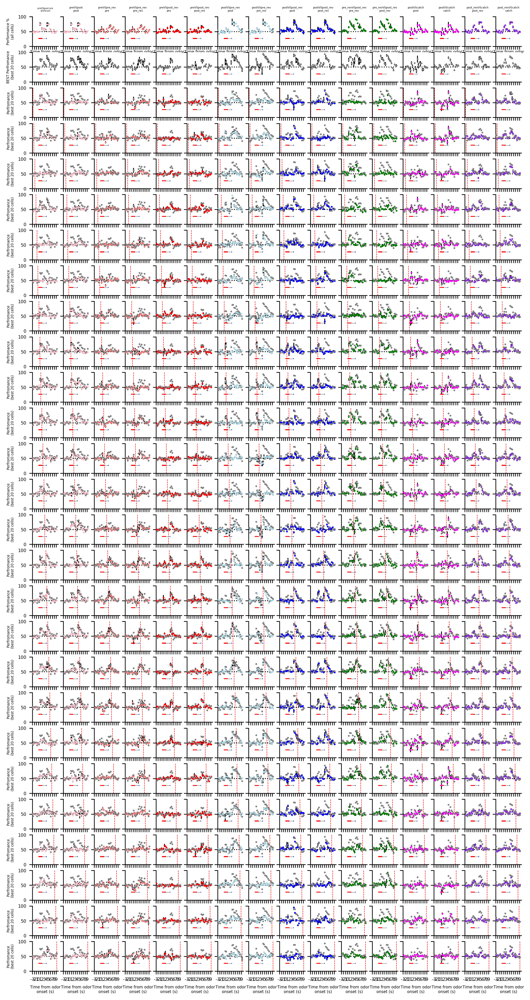

In [42]:
plot_ref_scores('shVScsm','top_20_abs',ylabel='Perfromance\n(best 20 cells)',subset_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


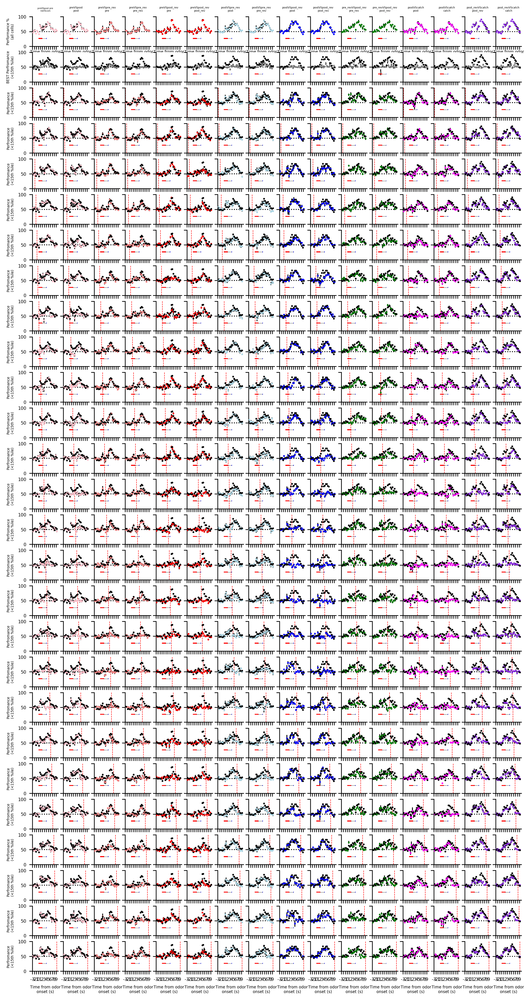

In [43]:
plot_ref_scores('rwVScsm','bottom15_abs',ylabel='Perfromance\n(<15th %ile)',all_cells_overlay=True)

plotting:
preVSpostpre     preVSpostpost     preVSpre_revpre     preVSpre_revpre_rev     preVSpost_revpre     preVSpost_revpost_rev     postVSpre_revpost     postVSpre_revpre_rev     postVSpost_revpost     postVSpost_revpost_rev     pre_revVSpost_revpre_rev     pre_revVSpost_revpost_rev     postVScatchpost     postVScatchcatch     post_revVScatchpost_rev     post_revVScatchcatch    


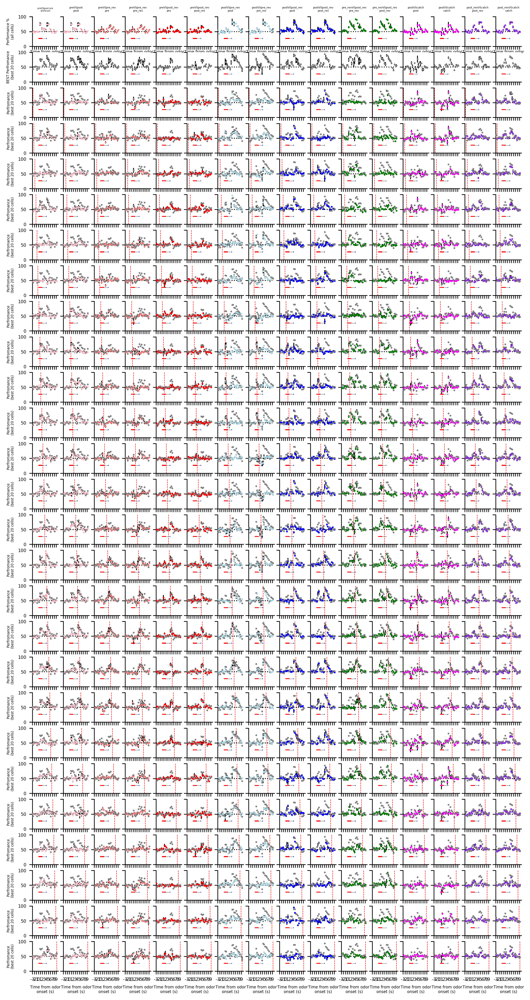

In [44]:
plot_ref_scores('shVScsm','top_20_abs',ylabel='Perfromance\n(best 20 cells)',subset_cells_overlay=True)

In [45]:
save_workspace(db)

Could not store variable 'sstats'. Skipping...
Could not store variable 'IPython'. Skipping...
Could not store variable 'ut'. Skipping...
Could not store variable 'di'. Skipping...
Could not store variable 'ip'. Skipping...
Could not store variable 'sys'. Skipping...
Could not store variable 'np'. Skipping...
Could not store variable 'pickle'. Skipping...
Could not store variable 'os'. Skipping...
Could not store variable 'pt'. Skipping...
Could not store variable 'pl'. Skipping...
